## Linear Regression Model
The observed patterns and relationships in the features fit the assumptions of a linear regression model, hence I decided to train the model with the dataset.

In [15]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score


X = df[['count_car', 'count_motorbike', 'hour']]
y = df['roadOccupancy']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

lr_model = LinearRegression()

lr_model.fit(X_train, y_train)

y_pred_lr = lr_model.predict(X_test)

print("Linear Regression Performance:")
print("Mean Squared Error:", mean_squared_error(y_test, y_pred_lr))
print("R^2 Score:", r2_score(y_test, y_pred_lr))

Linear Regression Performance:
Mean Squared Error: 0.004493944326104768
R^2 Score: 0.7099236366089241


## Residuals Plot

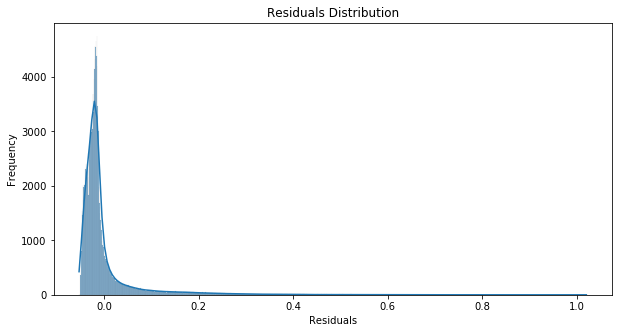

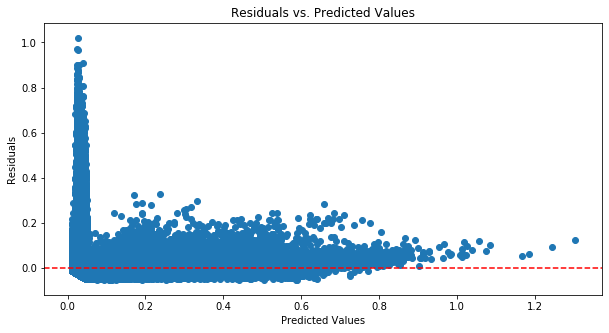

In [107]:
residuals = y_test - y_pred_lr

plt.figure(figsize=(10, 5))
sns.histplot(residuals, kde=True)
plt.title('Residuals Distribution')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

plt.figure(figsize=(10, 5))
plt.scatter(y_pred_lr, residuals)
plt.axhline(0, color='red', linestyle='--')
plt.title('Residuals vs. Predicted Values')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.show()


### Inference:

Based on the results of the linear regression model, it shows a non linear pattern in the data from the residual plot. Given this observation. Thus a non-linear model, specifically the Random Forest model selected for training the dataset.

## Random Forest Model

In [108]:
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
print("\nRandom Forest Regressor Performance:")
print("Mean Squared Error:", mean_squared_error(y_test, y_pred_rf))
print("R^2 Score:", r2_score(y_test, y_pred_rf))


Random Forest Regressor Performance:
Mean Squared Error: 0.004639400777657848
R^2 Score: 0.7382473200585605


## Inference:
Considering the enhanced accuracy achieved by the Random Forest model, I have decided to transition to XGBoost. XGBoost is an advanced model that leverages an ensemble of decision trees to optimize predictions further. This approach is expected to yield superior results due to its ability to handle complex relationships in the data more effectively than a single Random Forest model.

## XGBoost Model

In [17]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score


X = df[['count_car', 'count_motorbike', 'hour']]
y = df['roadOccupancy']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

xgb_model = XGBRegressor()
xgb_model.fit(X_train_scaled, y_train)
xgb_preds = xgb_model.predict(X_test_scaled)

xgb_mse = mean_squared_error(y_test, xgb_preds)
print("XGBoost Regressor Mean Squared Error:", xgb_mse)
print("R^2 Score:", r2_score(y_test, xgb_preds))

XGBoost Regressor Mean Squared Error: 0.0037491267616194864
R^2 Score: 0.7580003271101076


## Hyperparameter Tuning for XGBoost

In [18]:
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score

param_dist = {
    'n_estimators': [50, 100, 150, 200],
    'max_depth': [3, 4, 5, 6],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0]
}

xgb_reg = XGBRegressor()
random_search = RandomizedSearchCV(estimator=xgb_reg, param_distributions=param_dist, n_iter=70, cv=3, n_jobs=-1, verbose=2, random_state=42)
random_search.fit(X_train_scaled, y_train)

best_reg = random_search.best_estimator_

y_pred = best_reg.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Best Regressor Parameters:", random_search.best_params_)
print("Regressor Mean Squared Error:", mse)
print("Regressor R^2 Score:", r2)

Fitting 3 folds for each of 70 candidates, totalling 210 fits
Best Regressor Parameters: {'subsample': 0.9, 'n_estimators': 150, 'max_depth': 5, 'learning_rate': 0.1, 'colsample_bytree': 1.0}
Regressor Mean Squared Error: 0.0037028047389745236
Regressor R^2 Score: 0.7609903338611295


In [20]:
from sklearn.model_selection import cross_val_score

# Perform cross-validation
cv_scores = cross_val_score(best_reg, X_train_scaled, y_train, cv=5, scoring='r2')
print("Cross-validated R² scores:", cv_scores)
print("Mean cross-validated R² score:", cv_scores.mean())

Cross-validated R² scores: [0.74506042 0.74798182 0.76399336 0.74839632 0.75145348]
Mean cross-validated R² score: 0.7513770798556376


## Inference

The cross-validation results from XGBoost showed a further improvement in accuracy, which is better that the random forest model. Thus the model is used for further testing the unseen data.

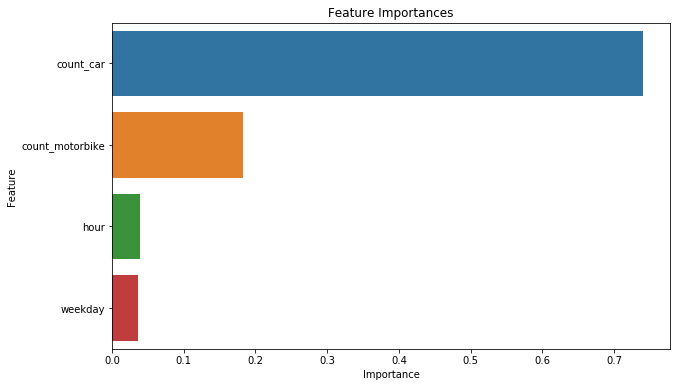

In [19]:
importances = best_reg.feature_importances_
feature_names = X.columns

features_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
features_df = features_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=features_df)
plt.title('Feature Importances')
plt.show()

In [9]:
import joblib
joblib.dump(best_reg, 'xgb_regressor_model_new.pkl')

## Loading new data for Prediction


In [7]:
test_df = pd.read_csv("traffic_density_test.csv")
test_df = test_df.drop(columns = ['vehicleTypeCount','Unnamed: 0.1','Unnamed: 0','id'])

In [8]:
test_df['observationDateTime'] = pd.to_datetime(test_df['observationDateTime'])
test_df['hour'] = test_df['observationDateTime'].dt.hour
test_df['day'] = test_df['observationDateTime'].dt.day
test_df['month'] = test_df['observationDateTime'].dt.month
test_df['weekday'] = test_df['observationDateTime'].dt.weekday

In [9]:
test_df = test_df.groupby(['roadID', 'junctionID', 'zoneID', 'hour', 'weekday', 'month']).agg({
    'vehicleCount': 'sum',
    'observationDateTime': 'first',
    'count_car': 'sum',
    'count_truck': 'sum',
    'count_motorbike': 'sum'
}).reset_index()


In [10]:
road_ids = test_df['roadID']
junction_ids = test_df['junctionID']

features = test_df[['count_car', 'count_motorbike', 'hour', 'weekday']]

In [36]:
test_df.head()

,roadID,junctionID,zoneID,hour,weekday,month,vehicleCount,observationDateTime,count_car,count_truck,count_motorbike
0,02,J031,2,0,0,6,10.0,2024-06-10 00:10:00+05:30,2,0,8
1,02,J031,2,0,1,6,7.0,2024-06-11 00:00:00+05:30,0,0,7
2,02,J031,2,1,0,6,4.0,2024-06-10 01:05:00+05:30,0,0,4
3,02,J031,2,1,1,6,3.0,2024-06-11 01:20:00+05:30,0,0,3
4,02,J031,2,2,0,6,7.0,2024-06-10 02:30:00+05:30,0,0,7


In [7]:
test_df = test_df.drop_duplicates()

In [11]:
xgb_model_loaded = joblib.load('/home/iudx/pari/python/model/xgb_regressor_model.pkl')

road_ids = test_df['roadID']
junction_ids = test_df['junctionID']

features = test_df[['count_car', 'count_motorbike', 'hour']]

predictions = xgb_model_loaded.predict(features)

output = pd.DataFrame({
    'roadID': road_ids,
    'junctionID': junction_ids,
    'roadOccupancy': predictions
})

#filtered_output = output[output['roadOccupancy'] > 0.6]


Adding the predicted road occupancy rate with the roadID and junctionID which is used to get the line string coordinates from the lane information.

In [11]:
output.head()

,datetime,roadID,junctionID,roadOccupancy
0,2024-06-10 00:10:00+05:30,02,J031,0.661676
1,2024-06-11 00:00:00+05:30,02,J031,0.440054
2,2024-06-10 01:05:00+05:30,02,J031,0.376083
3,2024-06-11 01:20:00+05:30,02,J031,0.345971
4,2024-06-10 02:30:00+05:30,02,J031,0.346212


### Preparing the available lane information from the Prayagraj city
Loading the LineString data for roads in Prayagraj City to create an interactive map that highlights different levels of traffic density across the city.

In [12]:
filename = "lane_info.csv"
df_lane = pd.read_csv(filename)
df_lane.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96 entries, 0 to 95
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0           96 non-null     int64  
 1   carriagewayLength    96 non-null     float64
 2   observationDateTime  96 non-null     object 
 3   junctionID           96 non-null     object 
 4   roadName             96 non-null     object 
 5   id                   96 non-null     object 
 6   roadID               96 non-null     object 
 7   location             96 non-null     object 
dtypes: float64(1), int64(1), object(6)
memory usage: 6.1+ KB


In [13]:
df_lane = df_lane.drop(columns = ['Unnamed: 0','id'])
df_lane.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96 entries, 0 to 95
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   carriagewayLength    96 non-null     float64
 1   observationDateTime  96 non-null     object 
 2   junctionID           96 non-null     object 
 3   roadName             96 non-null     object 
 4   roadID               96 non-null     object 
 5   location             96 non-null     object 
dtypes: float64(1), object(5)
memory usage: 4.6+ KB


In [14]:
import ast

def convert_dict_column(dict_str):
    return ast.literal_eval(dict_str.replace("'", '"'))

df_lane['location'] = df_lane['location'].apply(convert_dict_column)

lane_df = df_lane['location'].apply(pd.Series)

loc_df = lane_df.rename(columns=lambda x: x)
df_lane = pd.concat([df_lane, loc_df], axis=1)


## Displaying the lanes based on level of traffic density using Folium


In [16]:
from folium import features
from folium.features import DivIcon, GeoJson
from shapely.geometry import LineString
import folium
import warnings
warnings.filterwarnings('ignore')

df_filtered = pd.merge(output, df_lane, on=['junctionID', 'roadID' ])

def create_geojson_feature(coords, color):
    try:
        line = LineString(coords)
        return features.GeoJson(
            data=line.__geo_interface__,
            style_function=lambda x: {'color': color, 'weight': 5}
        )
    except ValueError as e:
        print(f"Error creating LineString: {e}")
        return None

folium_map = folium.Map(location=[25.4358, 81.8463], zoom_start=13)

def get_color(occupancy):
    
    if 0.3 < occupancy < 0.7:
        return 'yellow'
    elif occupancy > 0.7:
        return 'red'
    elif occupancy < 0.3:
        return 'green'
    

for _, row in df_filtered.iterrows():
    color = get_color(row['roadOccupancy'])
    geojson_feature = create_geojson_feature(row['coordinates'], color)
    if geojson_feature:
        geojson_feature.add_to(folium_map)

folium_map